# Машинное обучение, ФКН ВШЭ

## Практическое задание 2. Exploratory Data Analysis и линейная регрессия

### Общая информация
Дата выдачи: 25.09.2022

Мягкий дедлайн: 23:59MSK 10.10.2022

Жесткий дедлайн: 23:59MSK 18.10.2022

### О задании
В этом задании мы попытаемся научиться анализировать данные и выделять из них полезные признаки. Мы также научимся пользоваться `seaborn` и `sklearn`, а заодно привыкнем к основным понятиям машинного обучения.

### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов. Проверяющий имеет право снизить оценку за неэффективную реализацию или неопрятные графики.

**Обратите внимание**, что в каждом разделе домашнего задания есть оцениваниемые задачи и есть вопросы. Вопросы дополняют задачи и направлены на то, чтобы проинтерпретировать или обосновать происходящее. Код без интерпретации не имеет смысла, поэтому отвечать на вопросы обязательно — за отсутствие ответов мы будем снижать баллы за задачи. Если вы ответите на вопросы, но не напишете корректный код к соответствующим оцениваемым задачам, то баллы за такое выставлены не будут.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

### Формат сдачи
Задания сдаются через систему Anytask. Инвайт можно найти на странице курса. Присылать необходимо ноутбук с выполненным заданием. Сам ноутбук называйте в формате homework-practice-02-linregr-Username.ipynb, где Username — ваша фамилия.

Для удобства проверки самостоятельно посчитайте свою максимальную оценку (исходя из набора решенных задач) и укажите ниже.

Оценка: xx.

В этом ноутбуке используется библиотека `folium` для визуализации карт. Она работает в google colab!

In [90]:
!pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [91]:
import folium

m = folium.Map(location=(55.7522200, 37.6155600), zoom_start=10)

m

Если вы всё сделали правильно, то выше должна открыться карта Москвы.

In [92]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

%config InlineBackend.figure_format = 'retina'
plt.rcParams['figure.figsize'] = 8, 5
plt.rcParams['font.size'] = 12
plt.rcParams['savefig.format'] = 'pdf'
sns.set_style('darkgrid')

## Часть 0. Подготовка (1 балл)

**Задание 1 (1 балл)**. Мы будем работать с данными из соревнования [New York City Taxi Trip Duration](https://www.kaggle.com/c/nyc-taxi-trip-duration/overview), в котором нужно было предсказать длительность поездки на такси. Скачайте обучающую выборку из этого соревнования и загрузите ее:

In [93]:
# from google.colab import drive
# drive.mount('/content/gdrive')

# from google.colab import files
# files.upload()

# !pip install -q kaggle

# !mkdir -p ~/.kaggle
# !cp kaggle.json ~/.kaggle/

# !chmod 600 /root/.kaggle/kaggle.json

In [94]:
!kaggle competitions download -c nyc-taxi-trip-duration
!unzip nyc-taxi-trip-duration.zip
!unzip test.zip
!unzip train.zip
!rm *.zip

In [95]:
data = pd.read_csv('train.csv')

In [96]:
data.sample(5)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
1133193,id3367384,2,2016-06-07 15:04:34,2016-06-07 15:11:35,1,-73.953644,40.785355,-73.961670,40.773773,N,421
313785,id1711852,1,2016-04-04 13:24:00,2016-04-04 13:29:52,1,-73.964378,40.756424,-73.973846,40.751450,N,352
48426,id1317342,1,2016-05-12 18:30:50,2016-05-12 19:00:01,1,-73.962410,40.778732,-73.979889,40.754787,N,1751
560238,id0382567,1,2016-02-11 19:45:32,2016-02-11 20:06:22,1,-73.961449,40.764286,-73.991035,40.750198,N,1250
1143591,id1437907,2,2016-05-30 18:25:36,2016-05-30 18:39:08,1,-74.006271,40.733791,-73.973801,40.743309,N,812


In [97]:
data.describe()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration
count,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06
mean,1.534950e+00,1.664530e+00,-7.397349e+01,4.075092e+01,-7.397342e+01,4.075180e+01,9.594923e+02
std,4.987772e-01,1.314242e+00,7.090186e-02,3.288119e-02,7.064327e-02,3.589056e-02,5.237432e+03
min,1.000000e+00,0.000000e+00,-1.219333e+02,3.435970e+01,-1.219333e+02,3.218114e+01,1.000000e+00
25%,1.000000e+00,1.000000e+00,-7.399187e+01,4.073735e+01,-7.399133e+01,4.073588e+01,3.970000e+02
50%,2.000000e+00,1.000000e+00,-7.398174e+01,4.075410e+01,-7.397975e+01,4.075452e+01,6.620000e+02
75%,2.000000e+00,2.000000e+00,-7.396733e+01,4.076836e+01,-7.396301e+01,4.076981e+01,1.075000e+03
max,2.000000e+00,9.000000e+00,-6.133553e+01,5.188108e+01,-6.133553e+01,4.392103e+01,3.526282e+06


Обратите внимание на колонки `pickup_datetime` и `dropoff_datetime`. `dropoff_datetime` был добавлена организаторами только в обучающую выборку, то есть использовать эту колонку нельзя, давайте удалим ее. В `pickup_datetime` записаны дата и время начала поездки. Чтобы с ней было удобно работать, давайте преобразуем даты в `datetime`-объекты

In [98]:
data.drop(columns='dropoff_datetime', inplace=True, errors='ignore')
data['pickup_datetime'] = pd.to_datetime(data.pickup_datetime)
data['pickup_datetime'] = pd.to_datetime(data.pickup_datetime)

В колонке `trip_duration` записано целевое значение, которое мы хотим предсказывать. Давайте посмотрим на распределение таргета в обучающей выборке. Для этого нарисуйте его гистограмму:

Text(0, 0.5, 'number of data records')

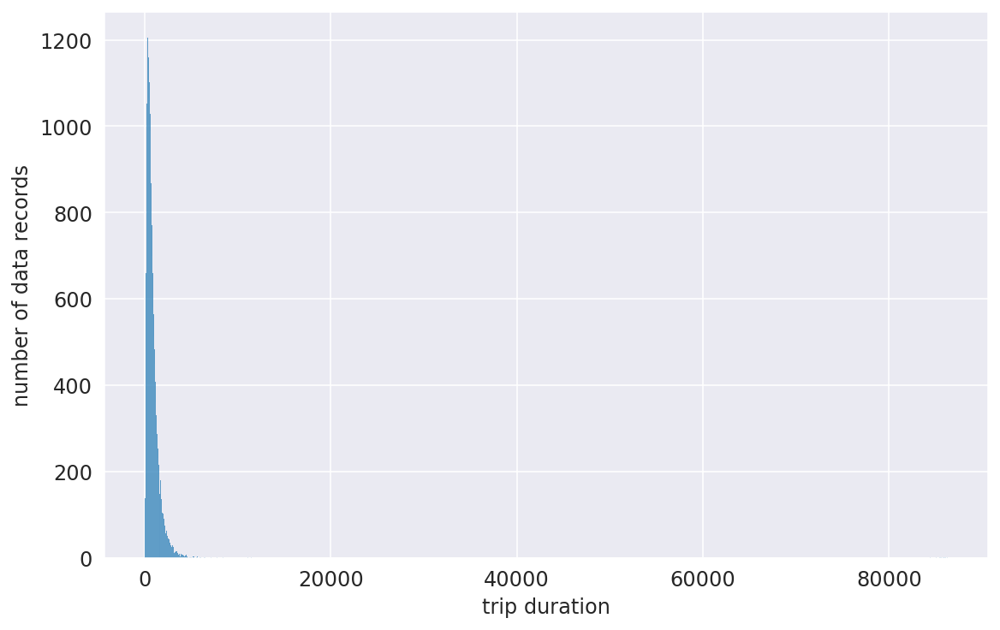

In [99]:
ax = sns.histplot(data['trip_duration'].sample(25000))
ax.set_xlabel('trip duration')
ax.set_ylabel('number of data records')

**Вопрос**: Что можно сказать о целевой переменной по гистограмме её значений?

**Ответ**: в основном поездки маленькое, до 10-15 минут. чем больее время рассматриваем, тем меньше зарегистрированных поездок. есть, судя по всему, какие-то выбросы с очень большим временем поездки, около 15-17 часов

В соревновании в качестве метрики качества использовалось RMSLE:
$$\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2}$$

**Вопрос**: Как вы думаете, почему авторы соревнования выбрали именно RMSLE, а не RMSE?

**Ответ**: RMSLE наказывает модель больше, если ее предсказанное время поездки меньше реального, по сравнению со случаем, когда оно больше реального. почему? рассмотрим симметричный случай на одном объекте, пусть $y$ –– реальное значение таргета, будем отклоняться от него на  $\pm \delta$

$$
\text{RMSLE}(x, y, y+\delta) = \big|\log{(y + 1)} - \log{(y + \delta + 1)}\big| =  \left|\log \frac{y+1}{y+\delta+1}\right| = \left|\log \left(1 -\frac{\delta}{y+\delta+1}\right)\right|
$$
$$
\text{RMSLE}(x, y, y-\delta) = \big|\log{(y + 1)} - \log{(y - \delta + 1)}\big| =  \left|\log \frac{y+1}{y-\delta+1}\right| = \left|\log \left(1 +\frac{\delta}{y+\delta+1}\right)\right|
$$

ну и заменим $k(\delta) = \frac{\delta}{y+\delta+1}$ для удоства

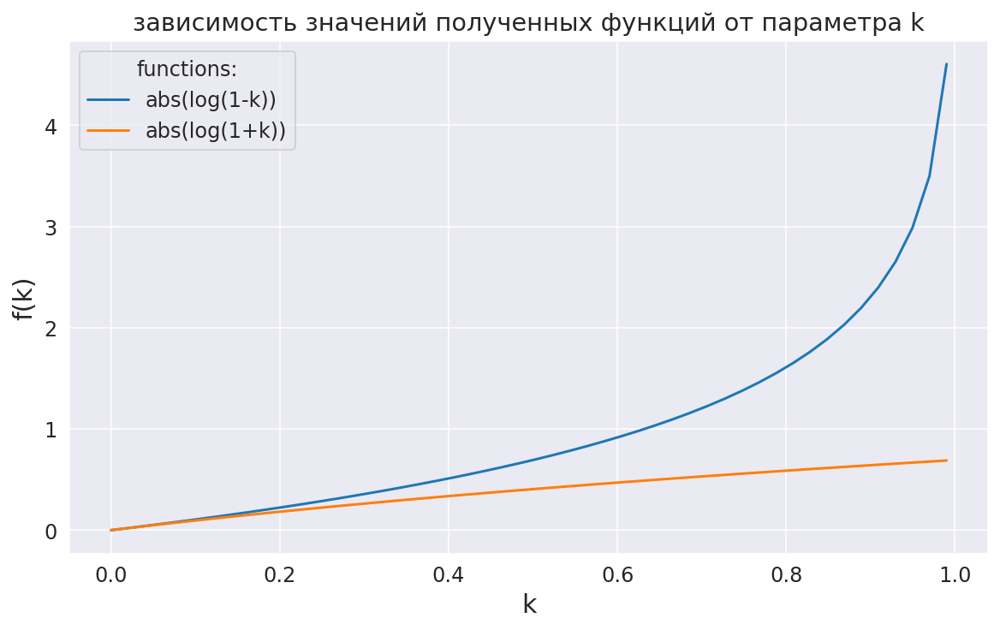

In [100]:
x = np.linspace(0, 0.99)
y_1 = np.abs(np.log(1-x))
y_2 = np.abs(np.log(1+x))

plt.plot(x, y_1)
plt.plot(x, y_2)

plt.xlabel('k', fontsize=15)
plt.ylabel('f(k)', fontsize=15)
plt.title('зависимость значений полученных функций от параметра k')

plt.legend(title='functions:', labels=['abs(log(1-k))', 'abs(log(1+k))'])

на графике видим, что отклонение в сторону большего значения наказывается меньше, чем в сторону меньшего

вероятно, это свойство хорошо для приложений такси, которые перед поездкой показывают примерное время поездки или подачи машины –– в обоих случаях лучше приехать раньше, чем позже

На семинаре мы рассматривали несколько моделей линейной регрессии в `sklearn`, но каждая из них оптимизировала среднеквадратичную ошибку (MSE), а не RMSLE. Давайте проделаем следующий трюк: будем предсказывать не целевую переменную, а ее *логарифм*. Обозначим $\hat{y}_i = \log{(y_i + 1)}$ — модифицированный таргет, а $\hat{a}(x_i)$ — предсказание модели, которая обучалась на $\hat{y}_i$, то есть логарифм таргета. Чтобы предсказать исходное значение, мы можем просто взять экспоненту от нашего предсказания: $a(x_i) = \exp(\hat{a}(x_i)) - 1$.

**Вопрос**: Покажите, что оптимизация RMSLE для модели $a$ эквивалентна оптимизации MSE для модели $\hat{a}$.

**Доказательство**: ╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ следите за руками


$$
\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2} = \\ \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \Big(\hat{y}_i - \log{\big( \exp(\hat a(x_i)) - 1 + 1\big)}\Big)^2} = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell}  \big(\hat{y}_i - \hat a(x_i)\big)^2} = \text{RMSE}(X, \hat y, \hat a)
$$

ну а что оптимизирует RMSE, то оптимизирует и MSE, ведь минимум корня достигается в точке, где достигается минимуму выражения под корнем

Итак, мы смогли свести задачу оптимизации RMSLE к задаче оптимизации MSE, которую мы умеем решать! Кроме того, у логарифмирования таргета есть еще одно полезное свойство. Чтобы его увидеть, добавьте к нашей выборке колонку `log_trip_duration` (воспользуйтесь `np.log1p`) и нарисуйте гистограмму модифицированного таргета по обучающей выборке. Удалите колонку со старым таргетом.

Text(0, 0.5, 'number of records')

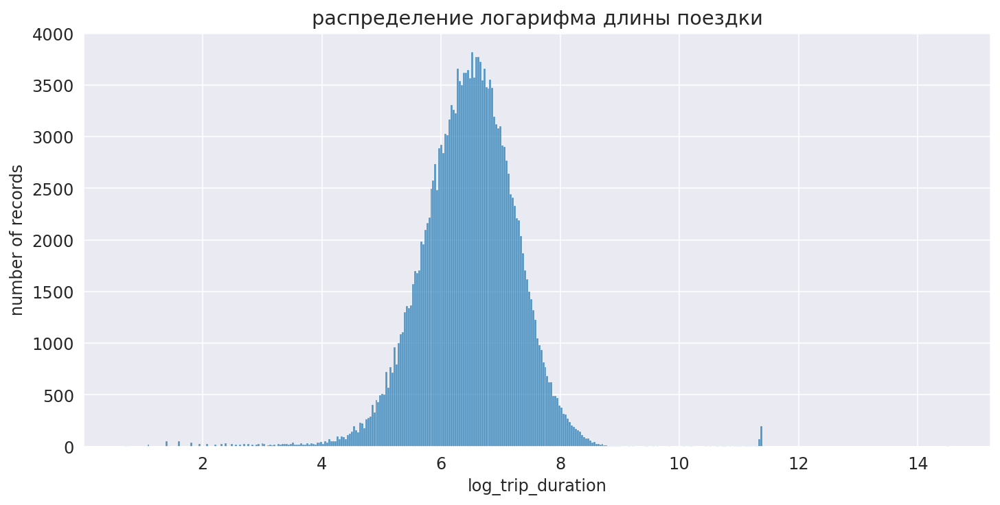

In [101]:
data['log_trip_duration'] = np.log1p(data['trip_duration'])
data.drop(columns=['trip_duration'], inplace=True)

plt.figure(figsize=(10, 5))
ax = sns.histplot(data['log_trip_duration'].sample(200000))
ax.set_title('распределение логарифма длины поездки')
ax.set_ylabel('number of records')

Чтобы иметь некоторую точку отсчета, давайте посчитаем значение метрики при наилучшем константном предсказании:

In [102]:
from sklearn.metrics import mean_squared_error
from math import sqrt

y = data['log_trip_duration']
n = y.shape

best_constant = y.mean()
print("data RMSE = %.4f" % mean_squared_error(y, best_constant * np.ones(n), squared=False))

data RMSE = 0.7958


## Часть 1. Изучаем `pickup_datetime` (2 балла)

**Задание 2 (0.25 баллов)**. Для начала давайте посмотрим, сколько всего было поездок в каждый из дней. Постройте график зависимости количества поездок от дня в году (например, можно воспользоваться `sns.countplot`):

In [103]:
data.sort_values(by='pickup_datetime', inplace=True)
data['day_month'] = data['pickup_datetime'].dt.strftime('%m-%d')

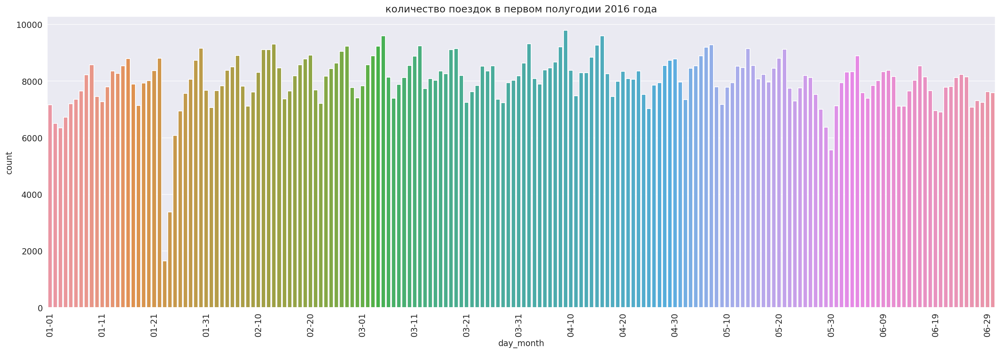

In [104]:
plt.figure(figsize=(20, 7))
ax = sns.countplot(x=data['day_month'])
ax.set_title('количество поездок в первом полугодии 2016 года')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

for index, label in enumerate(ax.get_xticklabels()):
    if index % 10 == 0:
        label.set_visible(True)
    else:
        label.set_visible(False)

plt.show()

**Вопрос**: Вы, вероятно, заметили, что на графике есть 2 периода с аномально маленькими количествами поездок. Вычислите, в какие даты происходили эти скачки вниз и найдите информацию о том, что происходило в эти дни в Нью-Йорке.

**Ответ**: по графику видно, что можно посмотреть случаи, когда поездок меньше 6 тысяч

In [105]:
data['day_month'].value_counts().loc[lambda count: count < 6000]

05-30    5570
01-24    3383
01-23    1648
Name: day_month, dtype: int64

30 мая 2016 года – Memorial Day в Америке, этот день посвящён памяти американских военнослужащих, погибших во всех войнах и вооружённых конфликтах, в которых США когда-либо принимали участие. в этот день у всех выходной + уже получше погода, люди стремятся погулять со своей семьей и не пользуются такси

а в конце января 2016 года были ужасные снегопады, все завалило снегом, по дорогам невозможно было ездить

Нарисуйте графики зависимости количества поездок от дня недели и от часов в сутках (воспользуйтесь `sns.relplot`):

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 0.98, 'зависимость количества поездок от для недели')

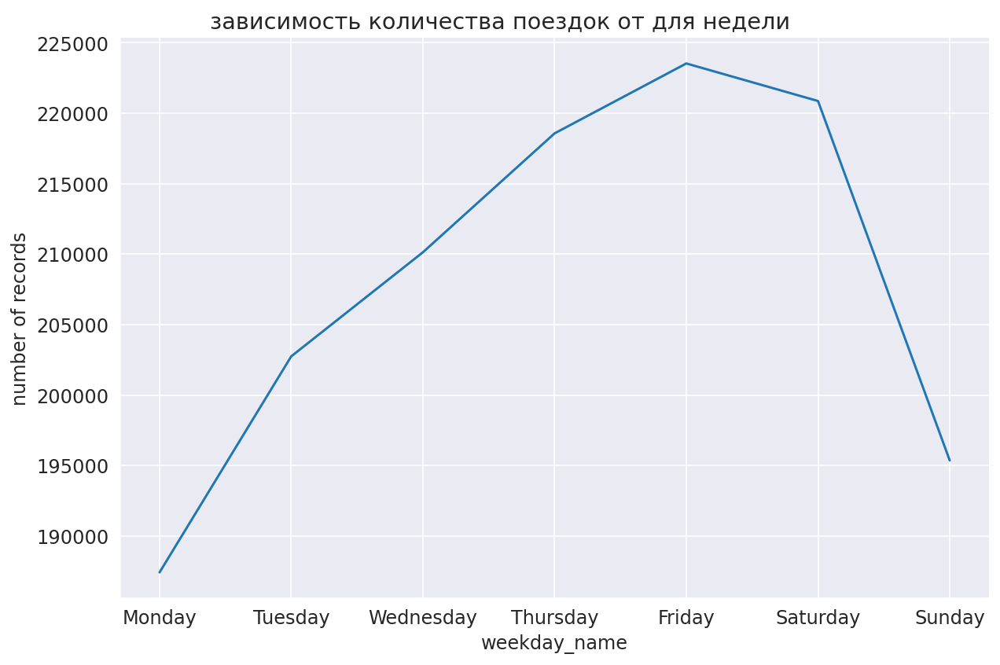

In [106]:
from pandas.api.types import CategoricalDtype

weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekdays_type = CategoricalDtype(categories=weekdays, ordered=True)

data['weekday_name'] = data['pickup_datetime'].dt.day_name().astype(weekdays_type)

ax = sns.relplot(data=data.groupby(by=['weekday_name']).count(), 
                 x="weekday_name", y="id", kind='line', height=6, aspect=1.5)
ax.set_ylabels('number of records')
ax.fig.subplots_adjust(top=0.94)
ax.fig.suptitle('зависимость количества поездок от для недели')

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  self._figure.tight_layout(*args, **kwargs)


Text(0.5, 0.98, 'зависимость количества поездок от времени дня')

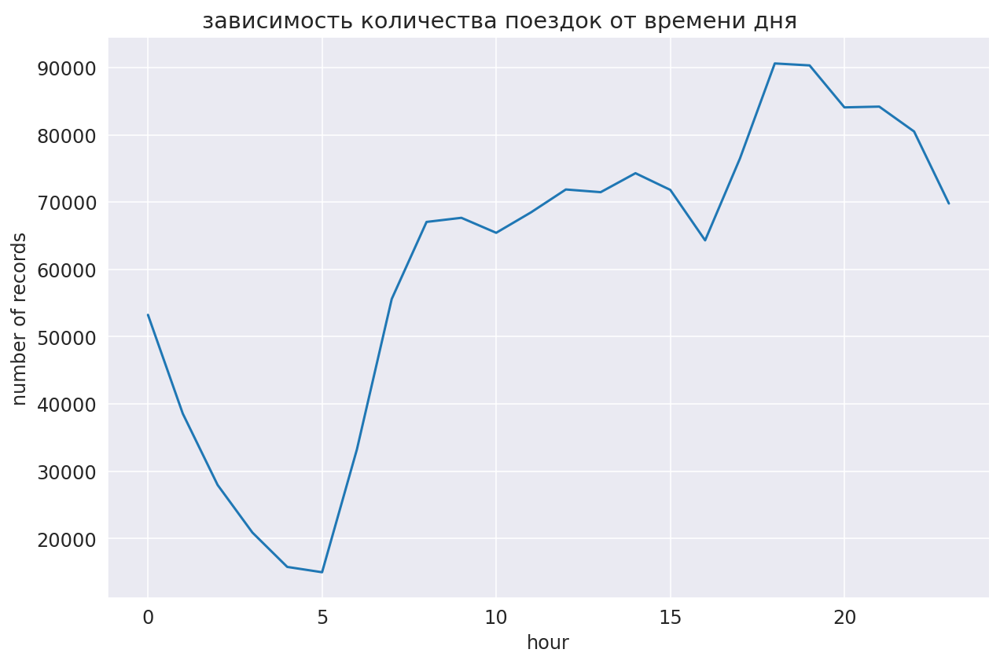

In [107]:
data['hour'] = data['pickup_datetime'].dt.hour

ax = sns.relplot(data=data.groupby(by=['hour']).count(), 
                 x="hour", y="id", kind='line', height=6, aspect=1.5)
ax.set_ylabels('number of records')
ax.fig.subplots_adjust(top=0.94)
ax.fig.suptitle('зависимость количества поездок от времени дня')

**Задание 3 (0.5 баллов)**. Нарисуйте на одном графике зависимости количества поездок от часа в сутках для разных месяцев (разные кривые, соответствующие разным месяцам, окрашивайте в разные цвета, воспользуйтесь `hue` в `sns.relplot`). Аналогично нарисуйте зависимости количества поездок от часа в сутках для разных дней недели.

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  self._figure.tight_layout(*args, **kwargs)


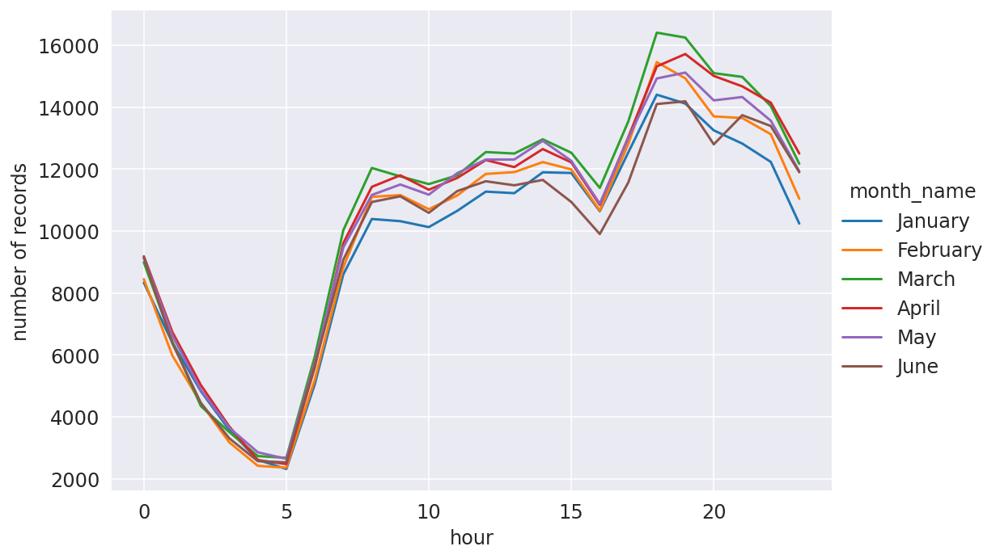

In [108]:
months = ['January', 'February', 'March', 'April', 'May', 'June']
months_type = CategoricalDtype(categories=months, ordered=True)

data['month_name'] = data['pickup_datetime'].dt.month_name().astype(months_type)

ax = sns.relplot(data=data.groupby(by=['hour', 'month_name']).count(),
                 x="hour", y="id", hue='month_name', kind='line', height=5, aspect=1.5)
ax.set_ylabels('number of records')

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  self._figure.tight_layout(*args, **kwargs)


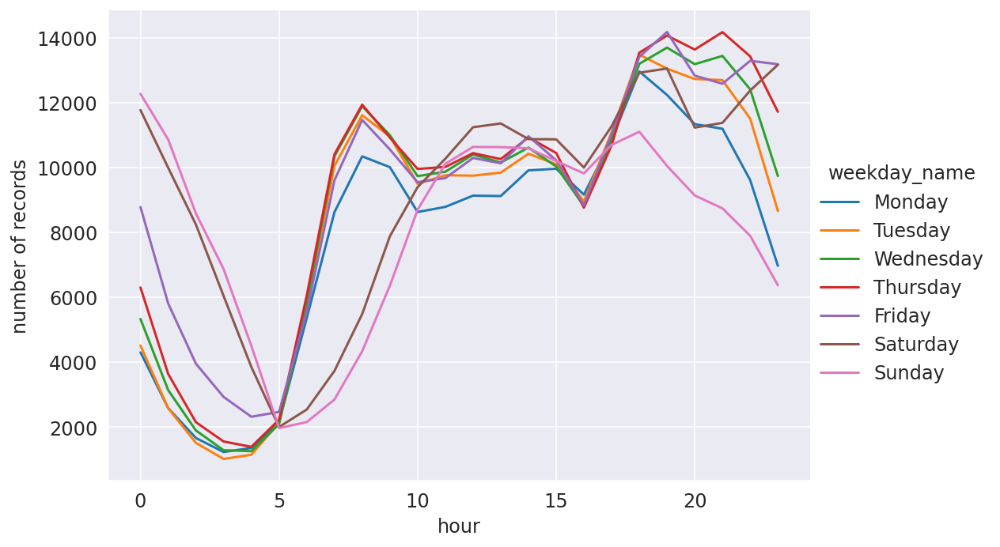

In [109]:
ax = sns.relplot(data=data.groupby(by=['hour', 'weekday_name']).count(),
                 x="hour", y="id", hue='weekday_name', kind='line', height=5, aspect=1.5)
ax.set_ylabels('number of records')

**Вопрос**: Какие выводы можно сделать, основываясь на графиках выше? Выделяются ли какие-нибудь дни недели? Месяца? Время суток? С чем это связано?

**Ответ**: если рассматривать дни недели, то сразу видно, что ближе к ее концу сдвигается время ночной "ямы", когда такси перестают заказывать, и сильно увеличивается количество заказов в районе 12-1 ночи. это логично, люди задерживаются где-то вне дома. еще можно заметить, что пик активности приходится где-то на 8-9 утра и на 6-7 вечера, что объясняется человеческим графиком работы  

если смотреть на месяца, то можно заметить, что самое низкое количество заказов в районе 4 дня у июня, я предполагаю, что люди начинают большу гулять пешком, ведь становится хорошая погода. интересное наблюдение, что в среднем в марте в принципе заказывают больше такси, не могу пока объяснить, с чем это связано. возможно, слякоть на улице, неприятно ходить пешком

**Задание 4 (0.5 баллов)**. Разбейте выборку на обучающую и тестовую в отношении 7:3. По обучающей выборке нарисуйте график зависимости среднего логарифма времени поездки от дня недели. Затем сделайте то же самое, но для часа в сутках и дня в году.

In [110]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(data, test_size=0.3, random_state=10)

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  self._figure.tight_layout(*args, **kwargs)


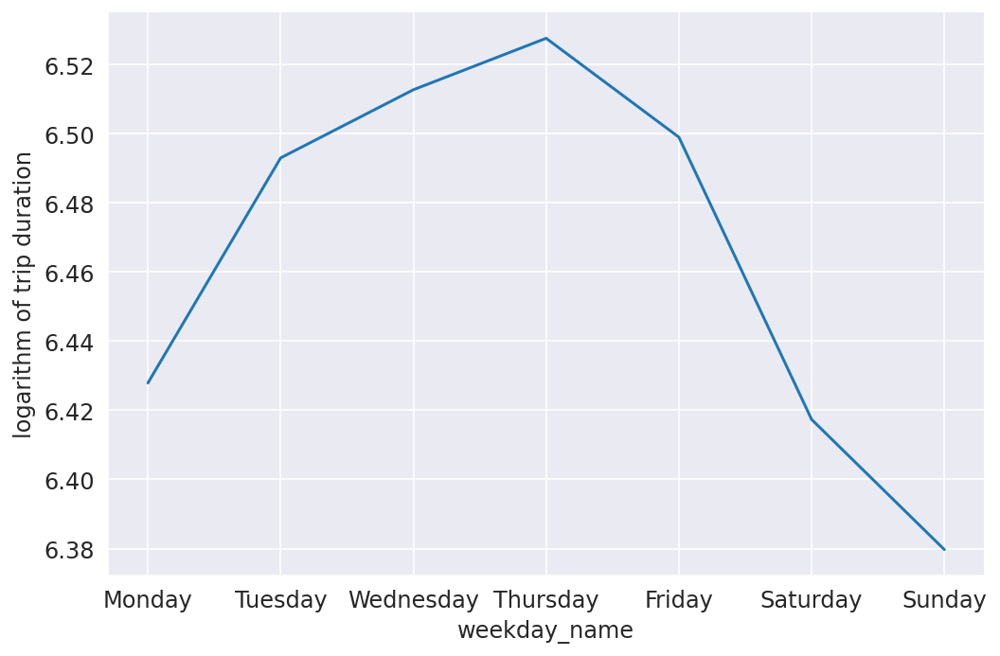

In [111]:
ax = sns.relplot(data=train.groupby(by=['weekday_name'])['log_trip_duration'].mean(), kind='line', height=5, aspect=1.5)
ax.set_ylabels('logarithm of trip duration')

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:88: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  self._figure.tight_layout(*args, **kwargs)


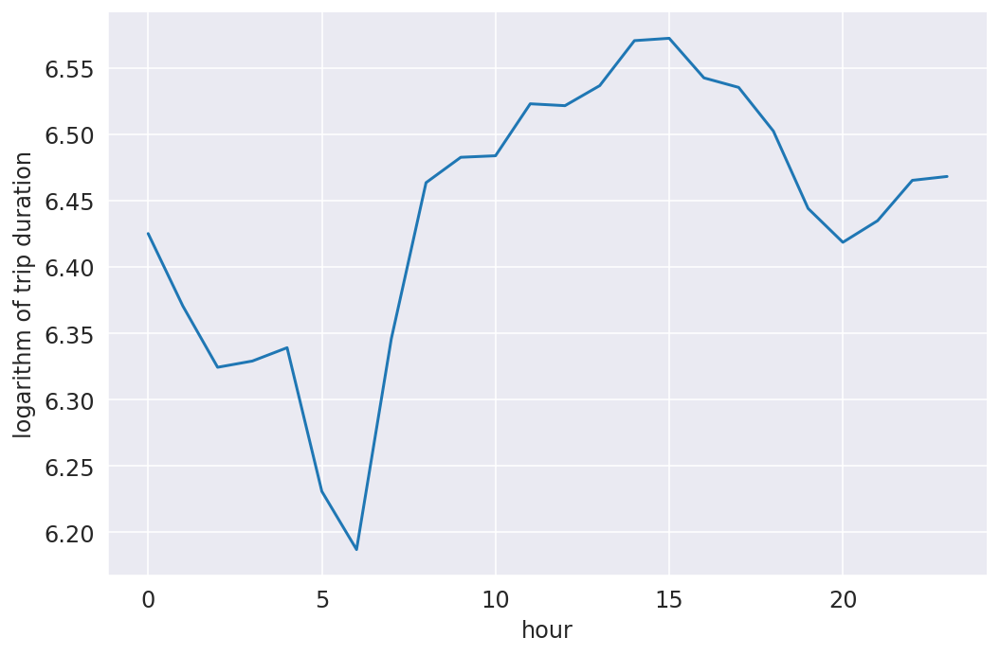

In [112]:
ax = sns.relplot(data=train.groupby(by=['hour'])['log_trip_duration'].mean(), kind='line', height=5, aspect=1.5)
ax.set_ylabels('logarithm of trip duration')

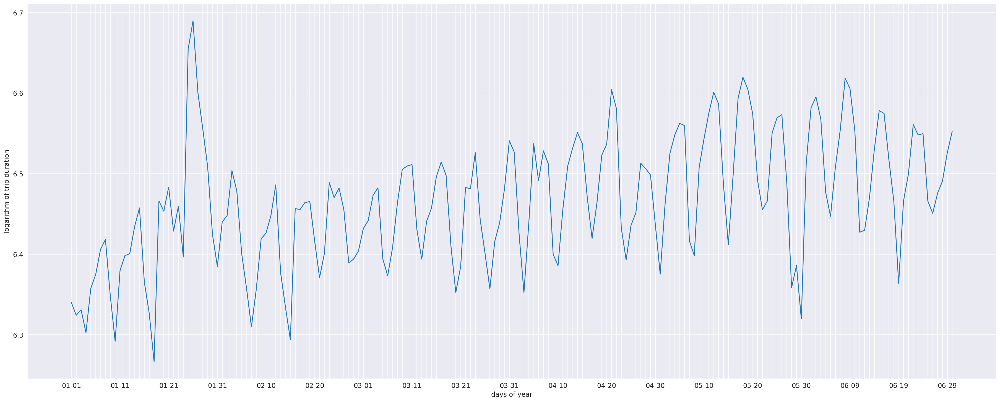

In [113]:
train.sort_values(by=['pickup_datetime'], inplace=True)
x = train['day_month'].unique()
y = train.groupby(by=['day_month'])['log_trip_duration'].mean()

fig, ax = plt.subplots(figsize = (25, 10))
ax.set_xlabel('days of year', fontsize=12)
ax.set_ylabel('logarithm of trip duration', fontsize=12)
ax.plot(x, y)

for index, label in enumerate(ax.xaxis.get_ticklabels()):
    if index % 10 != 0:
        label.set_visible(False)

**Вопрос**: Похожи ли графики зависимости таргета от дня недели и от часа в сутках на аналогичные графики для количества поездок? Почему? Что происходит со средним таргетом в те два аномальных периода, что мы видели выше? Почему так происходит? Наблюдаете ли вы какой-нибудь тренд на графике зависимости `log_trip_duration` от номера дня в году?


**Ответ**: да, в целом графики похожи, потому что если увеличивается количество используемого такси, то увеличивается количество машин на дорогах, от этого пробки, то есть среднее время поездки увеличивается

в день снегопада количество такси резко уменьшилось, но длина поездки стала больше, потому что те, кто решился взять такси, застряли в жуткой пробке из-за снегопада. а время поездки в мемориальный день примерно сравнимо с аналогичными днями, но все-таки чуть меньше, потому что пробок нет, машин мало

заметим, что есть тенденция увеличения количества времени поездки в зависимости от дня в году

Добавьте следующие признаки на основе `pickup_datetime`:
1. День недели
2. Месяц
3. Час
4. Является ли период аномальным (два бинарных признака, соответствующие двум аномальным периодам)
5. Номер дня в году

In [114]:
data['weekday'] = data['pickup_datetime'].dt.dayofweek
data['month'] = data['pickup_datetime'].dt.month

# час уже добавляла раньше

abnormal_january = (data['day_month'] == "01-24") | (data['day_month'] == "01-23")
abnormal_may = (data['day_month'] == "05-30") 

data['is_abnormal_may'] = 0
data['is_abnormal_january'] = 0
data.loc[abnormal_january, 'is_abnormal_january'] = 1
data.loc[abnormal_may, 'is_abnormal_may'] = 1

data['day_of_year'] = data['pickup_datetime'].dt.dayofyear

Итак, мы уже создали некоторое количество признаков.

**Вопрос**: Какие из признаков стоит рассматривать как категориальные, а какие - как численные? Почему?

**Ответ**: буду расссматривать все как категориальные, потому что не хочу, чтобы модель как-то на них обучалась как на числах, мы же не можем сказать, что 50 день года больше, чем 20

**Задание 5 (0.75 баллов)**. Обучите `Ridge`-регрессию с параметрами по умолчанию, закодировав все категориальные признаки с помощью `OneHotEncoder`. Численные признаки отмасштабируйте с помощью `StandardScaler`. Используйте только признаки, которые мы выделили в этой части задания.

In [115]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

train, test = train_test_split(data, test_size=0.3, random_state=10)

features = ['weekday', 'month', 'hour', 'is_abnormal_may', 'is_abnormal_january', 'day_of_year']
categorical = ['weekday', 'month', 'hour', 'day_of_year']
target = ['log_trip_duration']

x_train = train[features]
y_train = train[target]
x_test = test[features]
y_test = test[target]

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model = pipeline.fit(x_train, y_train)
y_pred = model.predict(x_test)
y_train_pred = model.predict(x_train)

print("test RMSE = %.4f" % mean_squared_error(y_test, y_pred, squared=False))
print("train RMSE = %.4f" % mean_squared_error(y_train, y_train_pred, squared=False))

test RMSE = 0.7884
train RMSE = 0.7874


## Часть 2. Изучаем координаты (3 балла)
Мы уже очень хорошо изучили данные о времени начала поездки, давайте теперь посмотрим на информацию о координатах начала и конца поездки. Мы подготовили для вас функцию, которая на карте рисует точки начала или конца поездки. Примеры ее вызова вы найдете ниже. Обратите внимание, что в эту функцию мы передаем лишь небольшой кусочек данных, посколько иначе функция будет работать очень долго

In [116]:
def show_circles_on_map(data, latitude_column, longitude_column, color):
    """
    The function draws map with circles on it.
    The center of the map is the mean of coordinates passed in data.
    
    data: DataFrame that contains columns latitude_column and longitude_column
    latitude_column: string, the name of column for latitude coordinates
    longitude_column: string, the name of column for longitude coordinates
    color: string, the color of circles to be drawn
    """

    location = (data[latitude_column].mean(), data[longitude_column].mean())
    m = folium.Map(location=location)

    for _, row in data.iterrows():
        folium.Circle(
            radius=100,
            location=(row[latitude_column], row[longitude_column]),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)

    return m

In [117]:
show_circles_on_map(train.sample(10000), "pickup_latitude", "pickup_longitude", "blue")

In [118]:
show_circles_on_map(train.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")

**Вопрос**: Какие две точки выделяются на карте?

**Ответ**: выделяются два аэропорта: JFK и LGA

**Задание 6 (0.75 балл)**. Как мы все прекрасно помним, $t = s / v_{\text{ср}}$, поэтому очевидно, что самым сильным признаком будет расстояние, которое необходимо проехать. Мы не можем посчитать точное расстояние, которое необходимо преодолеть такси, но мы можем его оценить, посчитав кратчайшее расстояние между точками начала и конца поездки. Чтобы корректно посчитать расстояние между двумя точками на Земле, можно использовать функцию `haversine`. Также можно воспользоваться кодом с первого семинара. Посчитайте кратчайшее расстояние для объектов и запишите его в колонку `haversine`:

In [119]:
def haversine_array(lat1, lng1, lat2, lng2):
    lat1, lng1, lat2, lng2 = map(np.radians, (lat1, lng1, lat2, lng2))
    AVG_EARTH_RADIUS = 6371  # in km
    lat = lat2 - lat1
    lng = lng2 - lng1
    d = np.sin(lat * 0.5) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(lng * 0.5) ** 2
    h = 2 * AVG_EARTH_RADIUS * np.arcsin(np.sqrt(d))
    return h

data.loc[:, 'haversine'] = haversine_array(data['pickup_latitude'].values, data['pickup_longitude'].values, 
                                                     data['dropoff_latitude'].values, data['dropoff_longitude'].values)

Так как мы предсказываем логарифм времени поездки и хотим, чтобы наши признаки были линейно зависимы с этой целевой переменной, нам нужно логарифмировать расстояние: $\log t = \log s - \log{v_{\text{ср}}}$. Запишите логарифм `haversine` в отдельную колонку:

In [120]:
data['haversine_log'] = np.log1p(data['haversine'])

Убедимся, что логарифм расстояния лучше коррелирует с нашим таргетом, чем просто расстояние:

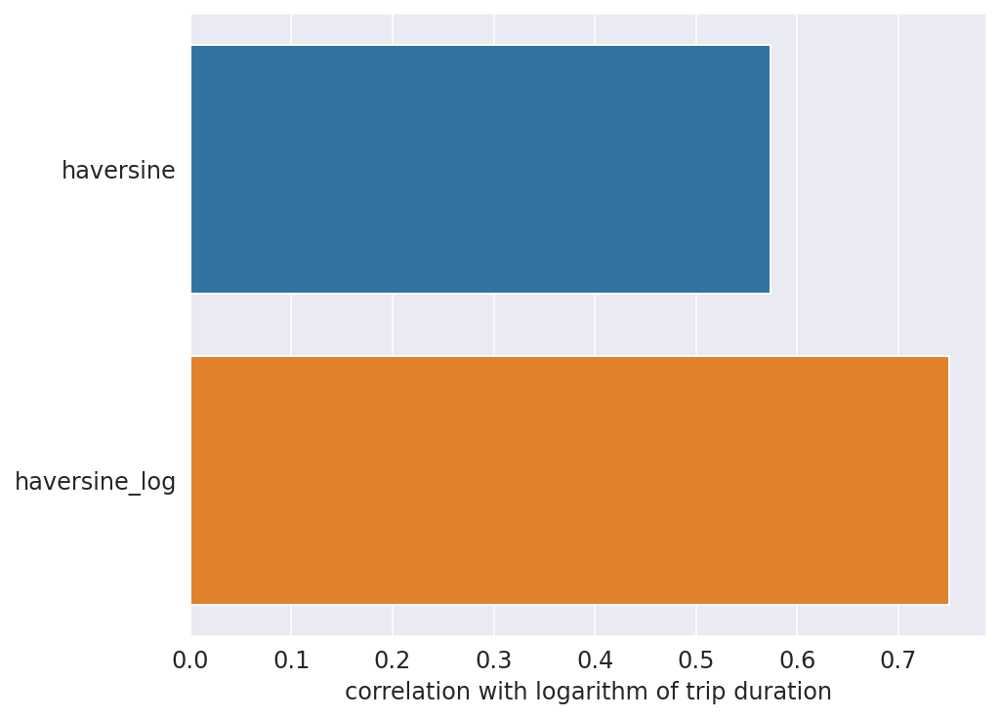

In [121]:
train, test = train_test_split(data, test_size=0.3, random_state=10)

correlations = train[['haversine','haversine_log']].corrwith(train['log_trip_duration'])

plot = sns.barplot(y=correlations.index, x=correlations)
plot.set_xlabel("correlation with logarithm of trip duration")
plot.figure.set_size_inches(7, 5)

**Задание 7 (0.75 балла)**. Давайте изучим среднюю скорость движения такси. Посчитайте среднюю скорость для каждого объекта обучающей выборки, разделив `haversine` на `trip_duration`, и нарисуйте гистограмму ее распределения

Text(0, 0.5, 'number of data records')

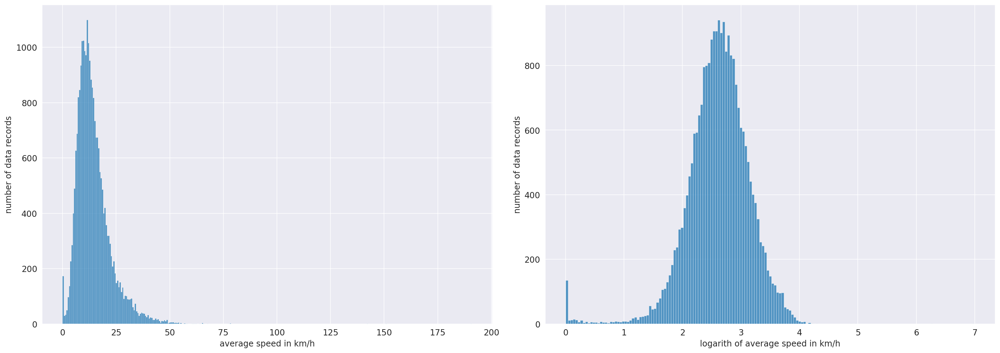

In [122]:
train['average_speed'] = train['haversine'] / (np.expm1(train['log_trip_duration']) / 3600)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))

hist1 = sns.histplot(train['average_speed'].sample(25000), ax=ax1)
hist1.set_xlabel('average speed in km/h')
hist1.set_ylabel('number of data records')

hist2 = sns.histplot(np.log1p(train['average_speed'].sample(25000)), ax=ax2)
hist2.set_xlabel('logarith of average speed in km/h')
hist2.set_ylabel('number of data records')

Как можно видеть по гистограмме, для некоторых объектов у нас получились очень больше значения скоростей. Нарисуйте гистограмму по объектам, для которых значение скорости получилось разумным (например, можно не включать рассмотрение объекты, где скорость больше некоторой квантили):

Text(0, 0.5, 'number of data records')

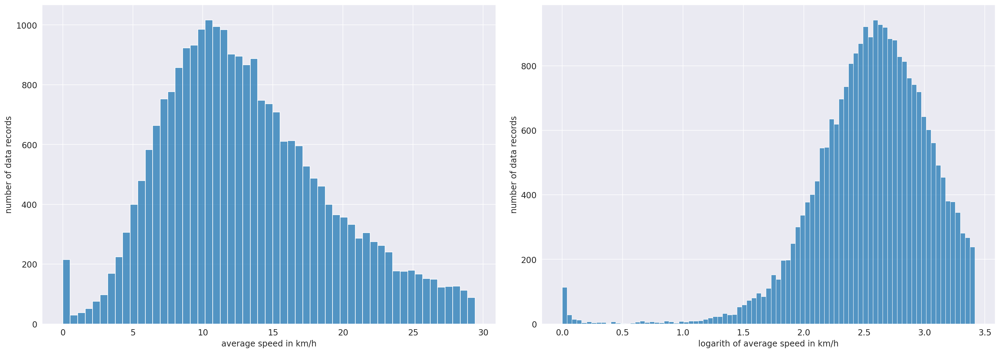

In [123]:
mask = (train['average_speed'] < np.quantile(train['average_speed'], 0.95))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))

hist1 = sns.histplot(train.loc[mask, 'average_speed'].sample(25000), ax=ax1)
hist1.set_xlabel('average speed in km/h')
hist1.set_ylabel('number of data records')

hist2 = sns.histplot(np.log1p(train.loc[mask, 'average_speed'].sample(25000)), ax=ax2)
hist2.set_xlabel('logarith of average speed in km/h')
hist2.set_ylabel('number of data records')

Для каждой пары (день недели, час суток) посчитайте медиану скоростей. Нарисуйте с помощью `sns.heatmap` график, где по осям будут дни недели и часы, а в качестве значения функции - медиана скорости

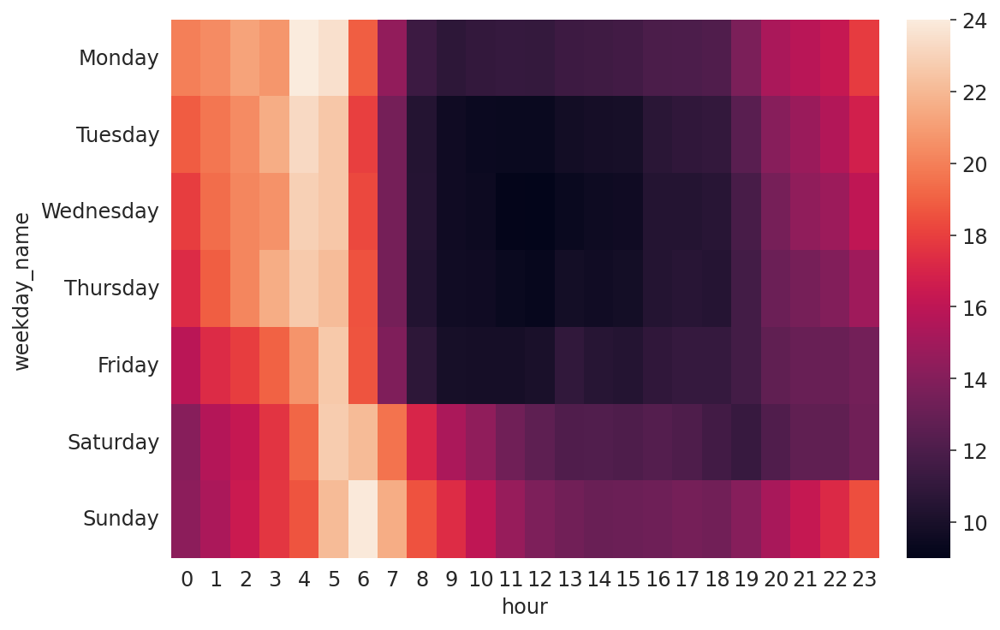

In [124]:
median = train.groupby(by=['weekday_name', 'hour'])['average_speed'].median()
median = median.reset_index().pivot(index='weekday_name', columns='hour', values='average_speed')

sns.heatmap(median)

Не забудьте удалить колонку со значением скорости из данных!

**Вопрос**: Почему значение скорости нельзя использовать во время обучения?

**Ответ**: потому что мы ее ввели из таргета, то есть она с таргетом линейно зависима, что сломает нашу модельку, ведь у нас ридж, то есть $\ell_2$ регуляризация, он сломается от линейной зависимости

In [125]:
train.drop(columns=['average_speed'], inplace=True, errors='ignore')

**Вопрос**: Посмотрите внимательно на график и скажите, в какие моменты времени скорость минимальна; максимальна.

**Ответ**: минимальна скорость по будням где-то в районе 9 утра до 15, максмальная 4-5 утра по будням и в субботу, в 6 утра в воскресенье

Создайте признаки "поездка совершается в период пробок" и "поездка совершается в период свободных дорог" (естественно, они не должен зависеть от скорости!):

In [126]:
days = ((data['weekday'] > 0) & (data['weekday'] < 4))
time = ((data['hour'] >= 9) & (data['hour'] <= 15))
traffic = (days & time)
days = (data['weekday'] == 5)
time = ((data['hour'] >= 9) & (data['hour'] <= 12))
traffic = (traffic | (days & time))

days = (data['weekday'] == 0)
time = ((data['hour'] >= 4) & (data['hour'] <= 5))
no_traffic = (days & time)
days = ((data['weekday'] >= 1) & (data['weekday'] <= 3))
time = (data['hour'] == 4)
no_traffic = (no_traffic | (days & time))
days = ((data['weekday'] >= 4) & (data['weekday'] <= 5))
time = (data['hour'] == 5)
no_traffic = (no_traffic | (days & time))
days = (data['weekday'] == 6)
time = ((data['hour'] >= 5) & (data['hour'] <= 6))
no_traffic = (no_traffic | (days & time))

data['no_traffic'] = 0
data.loc[no_traffic, 'no_traffic'] = 1
data['traffic'] = 0
data.loc[traffic, 'traffic'] = 1


**Задание 8 (0.25 балла)**. Как уже было замечено выше, на карте выделяются две точки вдали от Манхэттена. Для каждой из них добавьте в выборку два признака: началась ли поездка в ней и закончилась ли она в ней.

In [127]:
mask_start_JFK = (abs(data['pickup_longitude'] + 73.78) <= 0.04) & (abs(data['pickup_latitude'] - 40.64) <= 0.02)
mask_end_JFK = (abs(data['dropoff_longitude'] + 73.78) <= 0.04) & (abs(data['dropoff_latitude'] - 40.64) <= 0.02)

mask_start_LGA = (abs(data['pickup_longitude'] + 73.8725) <= 0.0175) & (abs(data['pickup_latitude'] - 40.775) <= 0.01)
mask_end_LGA = (abs(data['dropoff_longitude'] + 73.8725) <= 0.0175) & (abs(data['pickup_latitude'] - 40.775) <= 0.01)


data['start_JFK'] = 0
data.loc[mask_start_JFK, 'start_JFK'] = 1
data['end_JFK'] = 0
data.loc[mask_end_JFK, 'end_JFK'] = 1

data['start_LGA'] = 0
data.loc[mask_start_LGA, 'start_LGA'] = 1
data['end_LGA'] = 0
data.loc[mask_end_LGA, 'end_LGA'] = 1

Для каждого из созданных признаков нарисуйте "ящик с усами" (`sns.boxplot`) распределения логарифма времени поездки

[Text(0.5, 1.0, 'ending at LGA')]

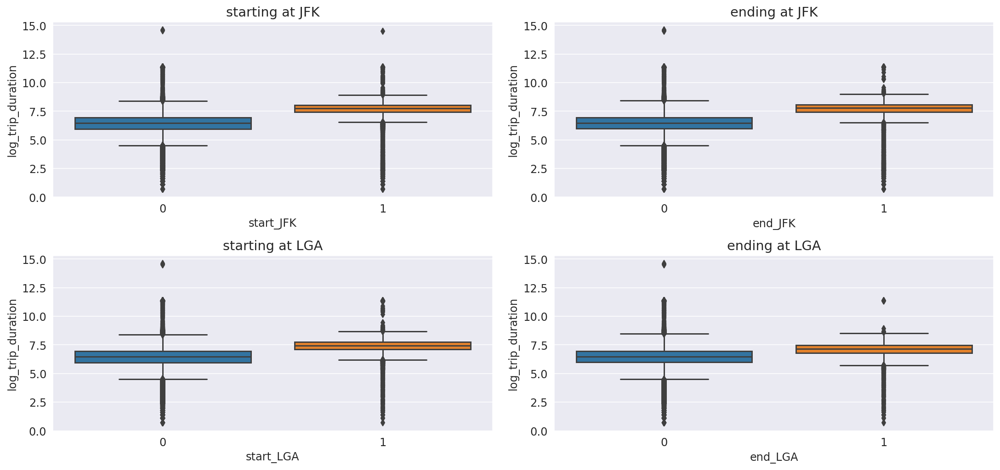

In [128]:
plt.rcParams['figure.constrained_layout.use'] = True

train, test = train_test_split(data, test_size=0.3, random_state=10)

fig, ax = plt.subplots(2, 2, figsize = (15, 7))

sns.boxplot(data=train, x='start_JFK', y='log_trip_duration', ax=ax[0, 0])
ax[0, 0].set(title='starting at JFK')
sns.boxplot(data=train, x='end_JFK', y='log_trip_duration', ax=ax[0, 1])
ax[0, 1].set(title='ending at JFK')
sns.boxplot(data=train, x='start_LGA', y='log_trip_duration', ax=ax[1, 0])
ax[1, 0].set(title='starting at LGA')
sns.boxplot(data=train, x='end_LGA', y='log_trip_duration', ax=ax[1, 1])
ax[1, 1].set(title='ending at LGA')

**Вопрос**: судя по графикам, как вы думаете, хорошими ли получились эти признаки?

**Ответ**: думаю, да, потому что их распределение довольно заметно отличается от распределния случаев, когда у нас начало и конец в других точках

<img src="https://www.dropbox.com/s/xson9nukz5hba7c/map.png?raw=1" align="right" width="20%" style="margin-left: 20px; margin-bottom: 20px">

**Задание 9 (1 балл)**. Сейчас мы почти что не используем сами значения координат. На это есть несколько причин: по отдельности рассматривать широту и долготу не имеет особого смысла, стоит рассматривать их вместе. Во-вторых, понятно, что зависимость между нашим таргетом и координатами не линейная. Чтобы как-то использовать координаты, можно прибегнуть к следующему трюку: обрамим область с наибольшим количеством поездок прямоугольником (как на рисунке). Разобьем этот прямоугольник на ячейки. Каждой точке сопоставим номер ее ячейки, а тем точкам, что не попали ни в одну из ячеек, сопоставим значение -1.

Напишите трансформер, который сначала разбивает показанную на рисунке область на ячейки, а затем создает два признака: номер ячейки, в которой началась поездка, и номер ячейки, в которой закончилась поездка. Количество строк и столбцов выберите самостоятельно.

Обратите внимание, что все вычисления должны быть векторизованными, трансформер не должен модифицировать передаваемую ему выборку inplace, а все необходимые статистики (если они вдруг нужны) нужно считать только по обучающей выборке в методе `fit`:

In [129]:
from sklearn.base import BaseEstimator, TransformerMixin


# TransformerMixin implements fit_transform for you,
# applying your fit and transform consistently
    
class MapGridTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, rows=5, columns=5):
        self.rows = rows
        self.columns = columns
        self.min_lon = -74.01
        self.max_lon = -73.90
        self.min_lat = 40.70
        self.max_lat = 40.80
        self.lon_step = abs(self.max_lon - self.min_lon) / rows
        self.lat_step = abs(self.max_lat - self.min_lat) / rows
    
    def show_map(self):
        # you may want to visualize cells
        pass
    
    def fit(self, X=None, y=None):
        # your code here
        return self

    def transform(self, X, y=None):
        X['zone_start'] = -1
        X['zone_end'] = -1

        left = self.min_lon
        for row in range(self.rows):
          right = left + self.lon_step
          top = self.max_lat
          for column in range(self.columns):
            bottom = top - self.lat_step
            mask = ((X['pickup_longitude'] <= right) & (X['pickup_longitude'] >= left) 
                    & (X['pickup_latitude'] <= top) & (X['pickup_latitude'] >= bottom))
            X.loc[mask, 'zone_start'] = column + row * self.columns

            mask = ((X['dropoff_longitude'] <= right) & (X['dropoff_longitude'] >= left) 
                    & (X['dropoff_latitude'] <= top) & (X['dropoff_latitude'] >= bottom))
            X.loc[mask, 'zone_end'] = column + row * self.columns

            top = bottom
          left = right

        return X

**Задание 10 (0.25 балла)**. Обучите `Ridge`-регрессию со стандартными параметрами на признаках, которые мы выделили к текущему моменту. Категориальные признаки закодируйте через one-hot-кодирование, числовые признаки отмасштабируйте.

In [130]:
features = ['weekday', 'month', 'hour', 'day_of_year', 'haversine_log',
            'is_abnormal_may', 'is_abnormal_january', 'no_traffic', 'traffic', 
            'start_JFK', 'end_JFK', 'start_LGA', 'end_LGA', 'zone_start', 'zone_end']
categorical = ['weekday', 'month', 'hour', 'day_of_year', 'zone_start', 'zone_end']
numeric = ['haversine_log']

target = ['log_trip_duration']

transformer = MapGridTransformer(25, 15)
data = transformer.transform(data)
train, test = train_test_split(data, test_size=0.3, random_state=10)

x_train = train[features]
y_train = train[target]
x_test = test[features]
y_test = test[target]

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model = pipeline.fit(x_train, y_train)
y_pred = model.predict(x_test)
y_train_pred = model.predict(x_train)

print("test RMSE = %.4f" % mean_squared_error(y_test, y_pred, squared=False))
print("train RMSE = %.4f" % mean_squared_error(y_train, y_train_pred, squared=False))

test RMSE = 0.4843
train RMSE = 0.4834


## Часть 3. Изучаем оставшиеся признаки (1 балл)

**Задание 11 (0.75 баллов)**. У нас осталось еще 3 признака, которые мы не исследовали: `vendor_id`, `passenger_count` и `store_and_fwd_flag`.

**Вопрос**: Подумайте, почему каждый из этих признаков может быть потенциально полезным.

**Ответ**: `vendor_id` – определенные водители ездят чуть быстрее, другие медленне; `store_and_fwd_flag` – флаг проблем со связью по факту, так что могут быть какие-то выбросы, что-то могло неправильно посчитаться; `passenger_count` – чем больше людей, тем машина медленнее едет, потому что ей тупо тяжело???))


Посчитайте, сколько есть уникальных значений у каждого из этих признаков:

In [131]:
print("unique vendor ids: ", data['vendor_id'].unique().shape[0])
print("unique passenger counts: ", data['passenger_count'].unique().shape[0])
print("unique flags: ", data['store_and_fwd_flag'].unique().shape[0])

unique vendor ids:  2
unique passenger counts:  10
unique flags:  2


Постройте "ящики с усами" распределений логарифма времени поездки в зависимости от значений каждого из признаков

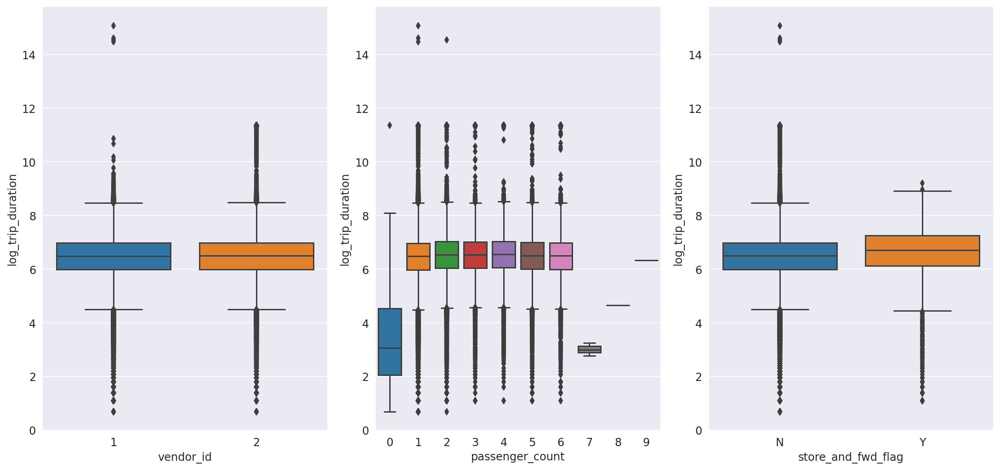

In [132]:
fig, ax = plt.subplots(1, 3, figsize = (15, 7))

sns.boxplot(data=data, x='vendor_id', y='log_trip_duration', ax=ax[0])
sns.boxplot(data=data, x='passenger_count', y='log_trip_duration', ax=ax[1])
sns.boxplot(data=data, x='store_and_fwd_flag', y='log_trip_duration', ax=ax[2])

Переведите признаки `vendor_id` и `store_and_fwd_flag` в значения $\{0;1\}$

In [133]:
data.loc[(data['vendor_id'] == 1), 'vendor_id'] = 0
data.loc[(data['vendor_id'] == 2), 'vendor_id'] = 1

data.loc[(data['store_and_fwd_flag'] == 'N'), 'store_and_fwd_flag'] = 0
data.loc[(data['vendor_id'] == 'Y'), 'store_and_fwd_flag'] = 1

**Вопрос**: Основываясь на графиках выше, как вы думаете, будут ли эти признаки сильными?

**Ответ**: кажется, для passenger count, норм признак. все остальные так себе, конечно

**Задание 12 (0.25 баллов)**. Проверьте свои предположения, обучив модель в том числе и на этих трех признаках. Обучайте `Ridge`-регрессию со стандартными параметрами. Категориальные признаки закодируйте one-hot-кодированием, а численные отмасштабируйте.

In [136]:
features = ['weekday', 'month', 'hour', 'is_abnormal_may', 'is_abnormal_january', 'day_of_year', 
            'haversine_log', 'no_traffic', 'traffic', 'start_JFK', 'end_JFK', 'start_LGA', 'end_LGA', 
            'vendor_id', 'passenger_count', 'store_and_fwd_flag', 'zone_start', 'zone_end']

categorical = ['weekday', 'month', 'hour', 'day_of_year', 'passenger_count', 'zone_start', 'zone_end']
numeric = ['haversine_log']

target = ['log_trip_duration']

train, test = train_test_split(data, test_size=0.3, random_state=10)

x_train = train[features]
y_train = train[target]
x_test = test[features]
y_test = test[target]

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model = pipeline.fit(x_train, y_train)
y_pred = model.predict(x_test)
y_train_pred = model.predict(x_train)

print("test RMSE = %.4f" % mean_squared_error(y_test, y_pred, squared=False))
print("train RMSE = %.4f" % mean_squared_error(y_train, y_train_pred, squared=False))

test RMSE = 0.4839
train RMSE = 0.4831


Если признаки не дали какого-то ощутимого улучшения метрики, их можно выбросить из данных.

а они действительно не дали ощутимых изменений

In [137]:
data.drop(columns=['vendor_id', 'passenger_count', 'store_and_fwd_flag'], inplace=True, errors='ignore')

## Часть 4. Улучшаем модель (3 балла)

**Задание 13 (1 балл)**. В наших данных есть нетипичные объекты: с аномально маленьким времени поездки, с очень большим пройденным расстоянием или очень большими остатками регрессии. В этом задании предлагается исключить такие объекты из обучающей выборки. Для этого нарисуйте гистограммы распределения упомянутых выше величин, выберите объекты, которые можно назвать выбросами, и очистите обучающую выборку от них.

Отметим, что хотя эти объекты и выглядят как выбросы, в тестовой выборке тоже скорее всего будут объекты с такими же странными значениями целевой переменной и/или признаков. Поэтому, возможно, чистка обучающей выборки приведёт к ухудшению качества на тесте. Тем не менее, всё равно лучше удалять выбросы из обучения, чтобы модель получалась более разумной и интерпретируемой.

Text(0.5, 0.98, 'before data cleaning')

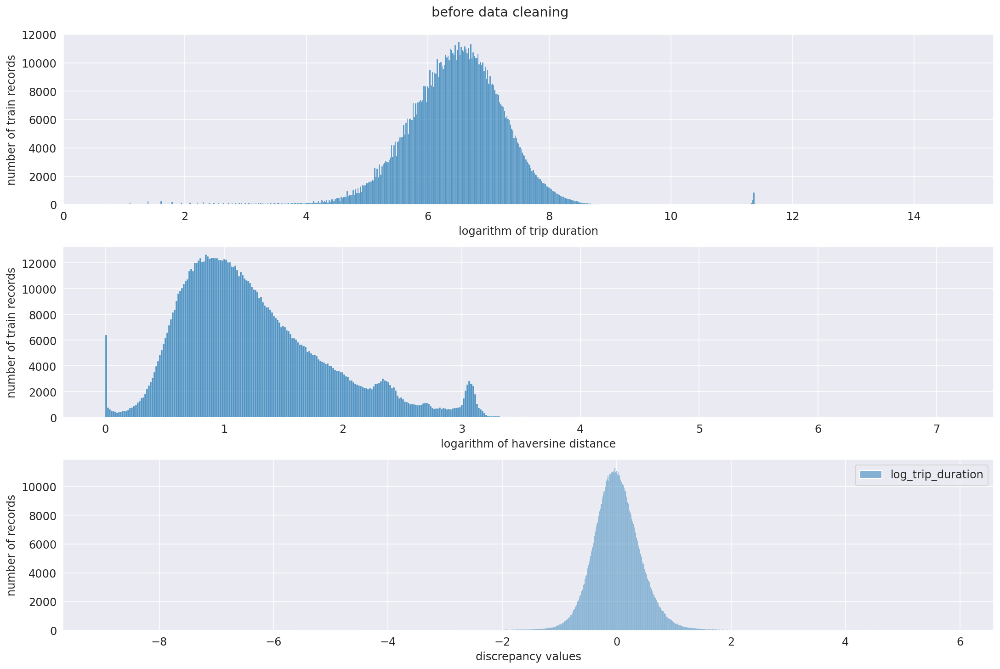

In [138]:
train, test = train_test_split(data, test_size=0.3, random_state=10)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 10))

hist1 = sns.histplot(train['log_trip_duration'], ax=ax1)
hist1.set_xlabel('logarithm of trip duration')
hist1.set_ylabel('number of train records')

hist2 = sns.histplot(train['haversine_log'], ax=ax2)
hist2.set_xlabel('logarithm of haversine distance')
hist2.set_ylabel('number of train records')

hist3 = sns.histplot((y_train_pred - y_train), ax=ax3)
hist3.set_xlabel('discrepancy values')
hist3.set_ylabel('number of records')

plt.suptitle("before data cleaning")


In [139]:
discrepancy = abs(y_train_pred - y_train)
mask = discrepancy.index[(discrepancy['log_trip_duration'] < np.quantile(discrepancy['log_trip_duration'], 0.95)) 
                            & (discrepancy['log_trip_duration'] > np.quantile(discrepancy['log_trip_duration'], 0.05))].to_list()
train = train.loc[mask]

mask = ((train['log_trip_duration'] >= 4) & (train['log_trip_duration'] <= 8.5)) 
train = train[mask]

mask = ((train['haversine_log'] > 0) & (train['haversine_log'] < 3.5)) 
train = train[mask]

Text(0.5, 0.98, 'after data cleaning')

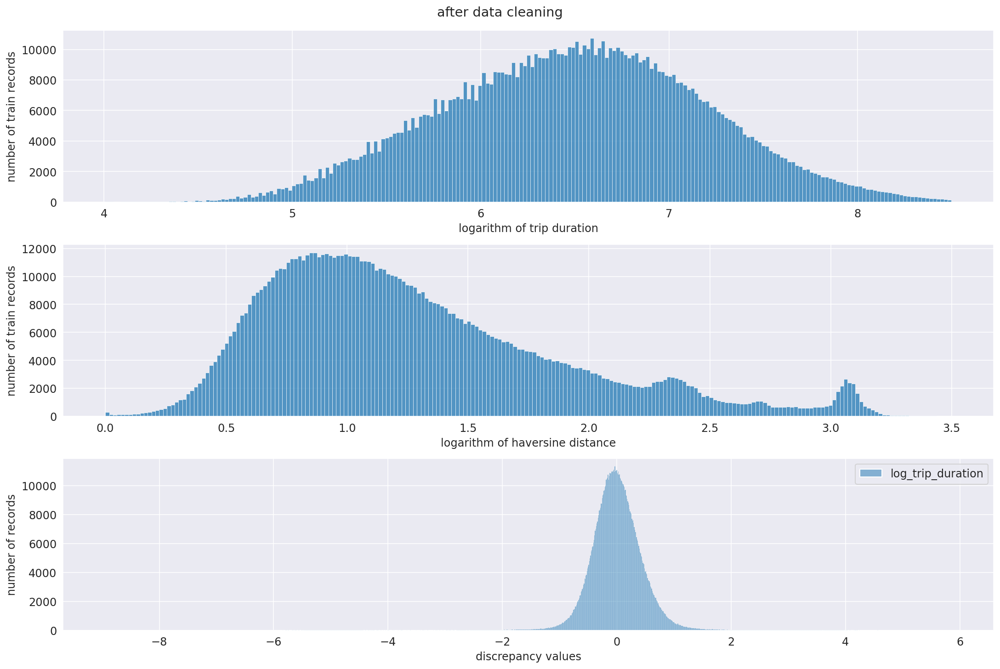

In [140]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 10))

hist1 = sns.histplot(train['log_trip_duration'], ax=ax1)
hist1.set_xlabel('logarithm of trip duration')
hist1.set_ylabel('number of train records')

hist2 = sns.histplot(train['haversine_log'], ax=ax2)
hist2.set_xlabel('logarithm of haversine distance')
hist2.set_ylabel('number of train records')

hist3 = sns.histplot((y_train_pred - y_train), ax=ax3)
hist3.set_xlabel('discrepancy values')
hist3.set_ylabel('number of records')

plt.suptitle("after data cleaning")

Сейчас у нас очень много категориальных признаков. В категориальных признаках могут содержаться редкие категории, обычно это плохо: модель сильно переобучается на таких примерах. Попробуйте объединить редкие категории в одну. Естественно, делать это нужно только для действительно редких категорий.

In [141]:
categorical = ['weekday', 'month', 'hour', 'day_of_year', 'zone_start', 'zone_end']

for category in categorical:
  values = train[category].value_counts()
  rare = values.index[values/train.shape[0] < 0.001].to_list()
  if len(rare) > 1:
    print(f"category {category}:\nnumber of rare values:", len(rare), "\nrare values:", rare, '\n')
    for value in rare:
      train.loc[(train[category] == value), category] = -1  
      test.loc[(test[category] == value), category] = -1  

category zone_start:
number of rare values: 190 
rare values: [175, 141, 189, 150, 65, 125, 213, 165, 52, 203, 212, 226, 227, 240, 197, 217, 168, 25, 79, 106, 225, 314, 237, 195, 38, 196, 211, 299, 236, 252, 230, 294, 279, 310, 193, 228, 298, 308, 210, 256, 241, 278, 292, 293, 112, 268, 251, 263, 323, 194, 307, 280, 223, 291, 277, 265, 222, 92, 329, 209, 283, 373, 343, 322, 264, 249, 336, 313, 180, 359, 296, 337, 328, 255, 374, 266, 267, 324, 281, 154, 356, 309, 351, 250, 306, 238, 358, 321, 325, 338, 367, 208, 139, 335, 248, 207, 326, 341, 127, 242, 176, 311, 282, 11, 221, 352, 253, 295, 269, 192, 179, 368, 344, 218, 369, 178, 371, 320, 305, 204, 285, 284, 224, 286, 206, 319, 372, 166, 105, 140, 366, 340, 339, 78, 276, 235, 190, 300, 148, 350, 219, 261, 262, 290, 254, 342, 234, 353, 327, 231, 301, 162, 229, 51, 167, 287, 355, 370, 288, 126, 274, 271, 354, 220, 312, 270, 272, 273, 365, 243, 64, 181, 297, 163, 205, 275, 10, 91, 334, 349, 191, 37, 21, 153, 232, 233, 177, 246, 239, 357] 


Обучите модель на очищенных данных и посчитайте качество на тестовой выборке.

In [142]:
features = ['weekday', 'month', 'hour', 'day_of_year', 'haversine_log',
            'is_abnormal_may', 'is_abnormal_january', 'no_traffic', 'traffic', 
            'start_JFK', 'end_JFK', 'start_LGA', 'end_LGA', 'zone_start', 'zone_end']
categorical = ['weekday', 'month', 'hour', 'day_of_year', 'zone_start', 'zone_end']
numeric = ['haversine_log']

target = ['log_trip_duration']

x_train = train[features]
y_train = train[target]
x_test = test[features]
y_test = test[target]

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric)
])

pipeline = Pipeline(steps=[
    ('ohe_scaling_and_cells', column_transformer),
    ('regression', Ridge())
])

model = pipeline.fit(x_train, y_train)
y_pred = model.predict(x_test)
y_train_pred = model.predict(x_train)

print("test RMSE = %.4f" % mean_squared_error(y_test, y_pred, squared=False))
print("train RMSE = %.4f" % mean_squared_error(y_train, y_train_pred, squared=False))

test RMSE = 0.4863
train RMSE = 0.3547


**Задание 14 (1 балл)**. После OneHot-кодирования количество признаков в нашем датасете сильно возрастает. Посчитайте колиество признаков до и после кодирования категориальных признаков.

In [143]:
count = len(features)
print('number of features before onehot-encoding:', count)
for category in categorical:
  count += train[category].unique().shape[0] - 1
print('number of features after onehot-encoding:', count)

number of features before onehot-encoding: 15
number of features after onehot-encoding: 468


Попробуйте обучить не `Ridge`-, а `Lasso`-регрессию. Какой метод лучше?

In [144]:
from sklearn.linear_model import Lasso

features = ['weekday', 'month', 'hour', 'day_of_year', 'haversine_log',
            'is_abnormal_may', 'is_abnormal_january', 'no_traffic', 'traffic', 
            'start_JFK', 'end_JFK', 'start_LGA', 'end_LGA', 'zone_start', 'zone_end']
categorical = ['weekday', 'month', 'hour', 'day_of_year', 'zone_start', 'zone_end']

numeric = ['haversine_log']
coordinates = ['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude']

target = ['log_trip_duration']

x_train = train[features]
y_train = train[target]
x_test = test[features]
y_test = test[target]

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso())
])

model = pipeline.fit(x_train, y_train)
y_pred = model.predict(x_test)
y_train_pred = model.predict(x_train)

print("test RMSE = %.4f" % mean_squared_error(y_test, y_pred, squared=False))
print("train RMSE = %.4f" % mean_squared_error(y_train, y_train_pred, squared=False))

test RMSE = 0.7970
train RMSE = 0.6908


ну че-то ридж получше справляется, конечно

Разбейте обучающую выборку на обучающую и валидационную в отношении 8:2. По валидационной выборке подберите оптимальные значения параметра регуляризации (по логарифмической сетке) для `Ridge` и `Lasso`, на тестовой выборке измерьте качество лучшей полученной модели.

best lasso alpha = 0.0001
validation RMSE for best alpha = 0.3896
test RMSE for best alpha = 0.5095


Text(0.5, 1.0, 'LASSO')

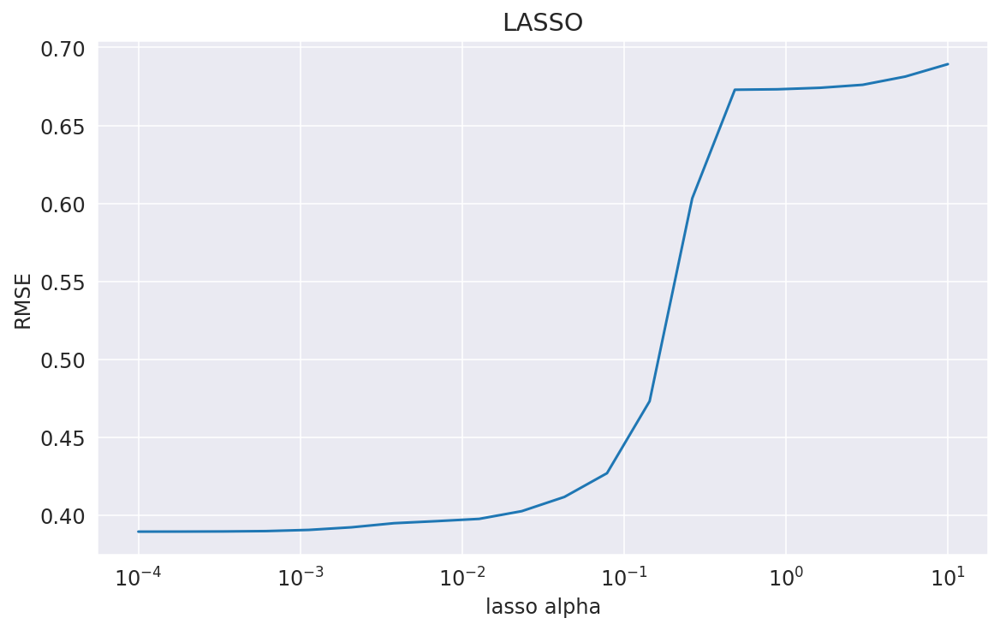

In [145]:
from sklearn.model_selection import GridSearchCV

x_train, x_validation, y_train, y_validation = train_test_split(x_train, y_train, test_size=0.2, random_state=10)

alphas = np.logspace(-4, 1, 20)
lasso_min_error = 10000000
lasso_errors = list()
lasso_best_alpha = 0
zeros = list()

lasso_error_test = 0

for alpha in alphas:
  model = Lasso(alpha)
  model.fit(x_train, y_train)
  zeros.append(np.sum(model.coef_ == 0))

  y_pred = model.predict(x_validation)
  error = mean_squared_error(y_validation, y_pred, squared=False)
  lasso_errors.append(error)
  if error < lasso_min_error:
    lasso_error_test = mean_squared_error(y_test, model.predict(x_test), squared=False)
    lasso_min_error = error
    lasso_best_alpha = alpha

print("best lasso alpha = %.4f" % lasso_best_alpha)
print("validation RMSE for best alpha = %.4f" % lasso_min_error)
print("test RMSE for best alpha = %.4f" % lasso_error_test)

plt.plot(alphas, lasso_errors)
plt.xscale("log")
plt.xlabel("lasso alpha")
plt.ylabel("RMSE")
plt.title("LASSO")

best ridge alpha = 62.3551
validation RMSE for best alpha = 0.3895
best test RMSE for best alpha = 0.5094


Text(0.5, 1.0, 'RIDGE')

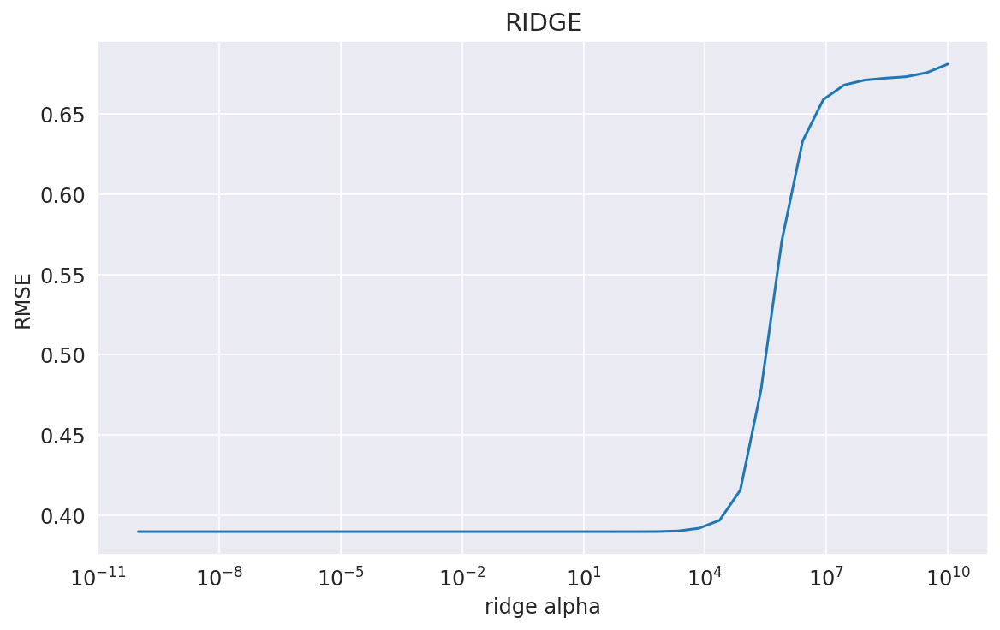

In [146]:
alphas = np.logspace(-10, 10, 40)
ridge_min_error = 10000000
ridge_errors = list()
ridge_best_alpha = 0

ridge_error_test = 0

for alpha in alphas:
  model = Ridge(alpha)
  model.fit(x_train, y_train)

  y_pred = model.predict(x_validation)
  error = mean_squared_error(y_validation, y_pred, squared=False)
  ridge_errors.append(error)
  if error < ridge_min_error:
    ridge_error_test = mean_squared_error(y_test, model.predict(x_test), squared=False)
    ridge_min_error = error
    ridge_best_alpha = alpha

print("best ridge alpha = %.4f" % ridge_best_alpha)
print("validation RMSE for best alpha = %.4f" % ridge_min_error)
print("best test RMSE for best alpha = %.4f" % ridge_error_test)

plt.plot(alphas, ridge_errors)
plt.xscale("log")
plt.xlabel("ridge alpha")
plt.ylabel("RMSE")
plt.title("RIDGE")

Для каждого перебранного `alpha` для Lasso посчитайте количество нулевых весов в модели и нарисуйте график зависимости его от `alpha`. Как сильно придётся потерять в качестве, если мы хотим с помощью Lasso избавиться хотя бы от половины признаков?

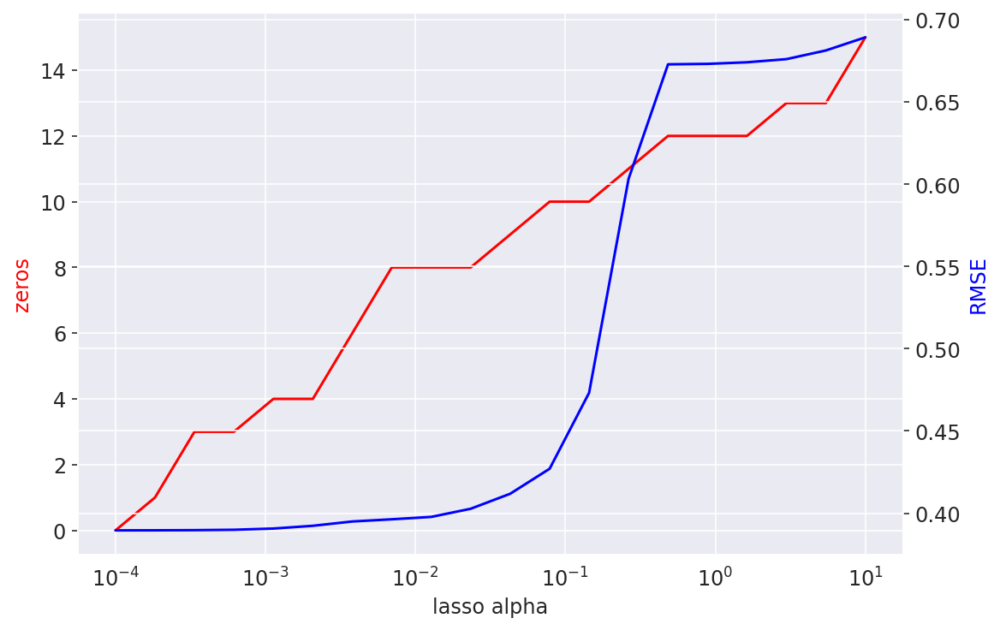

In [147]:
alphas = np.logspace(-4, 1, 20)

fig, ax = plt.subplots()
ax.plot(alphas, zeros, color="red")
ax.set(xscale="log", xlabel="lasso alpha")
ax.set_ylabel("zeros", color="red")

ax2 = ax.twinx()
ax2.plot(alphas, lasso_errors, color="blue")
ax2.set_ylabel("RMSE", color="blue")
plt.show()

In [148]:
print("validation RMSE for best alpha = %.4f" % lasso_min_error)

minimal = 0
for i in range(len(zeros)):
  if zeros[i] >= 25:
    minimal = i
print("validation RMSE using alpha with maximum zeros in features = %.4f" % lasso_errors[i])
print("difference = %.4f" % (lasso_errors[i] - lasso_min_error))


validation RMSE for best alpha = 0.3896
validation RMSE using alpha with at least 25 zeros in features = 0.6893
difference = 0.2998


<img src="https://www.dropbox.com/s/wp4jj0599np17lh/map_direction.png?raw=1" width="20%" align="right" style="margin-left: 20px">

**Задание 15 (1 балл)**. Часто бывает полезным использовать взаимодействия признаков (feature interactions), то есть строить новые признаки на основе уже существующих. Выше мы разбили карту Манхэттена на ячейки и придумали признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка".

Давайте попробуем сделать следующее: посчитаем, сколько раз встречается каждая возможная пара этих признаков в нашем датасете и выберем 100 самых частых пар. Закодируем поездки с этими частыми парами как категориальный признак, остальным объектам припишем -1. Получается, что мы закодировали, откуда и куда должно было ехать такси.

Также можете придумать ещё какой-нибудь способ сделать признаки про маршрут. Если эти признаки будут давать хороший прирост в качестве, то за это могут быть даны дополнительные бонусные баллы.

**Вопрос**: Почему такой признак потенциально полезный? Почему линейная модель не может самостоятельно "вытащить" эту информацию, ведь у нее в распоряжении есть признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка"?

**Ответ**: полезным этот признак может быть, потому что зоны небольшие и погрешностью на передвижения внутри одной зоны можно пренебречь, так что можно классно обучаться не на координатах, а именно на зонах. а модель не может сама "достать" этот признак, потому что рассматривает зоны начала и конца как независимые признаки

In [149]:
zones = pd.DataFrame(train[(train['zone_start'] != -1) & (train['zone_end'] != -1)]
                     .groupby(by=['zone_start', 'zone_end'])['id']
                     .count()
                     .sort_values(ascending=False))
popular_zones = zones.index[:100].to_list()

train['zones'] = -1
test['zones'] = -1

index = 0
for start, end in popular_zones:
  train.loc[(train['zone_start'] == start) & (train['zone_end'] == end), 'zones'] = index
  test.loc[(test['zone_start'] == start) & (test['zone_end'] == end), 'zones'] = index
  index += 1

Заново обучите модель (`Ridge`, если она дала более высокое качество в предыдущих экспериментах, и `Lasso` иначе) на новых даннных и посчитайте качество на тестовой выборке

In [150]:
features = ['weekday', 'month', 'hour', 'is_abnormal_may', 'is_abnormal_january', 'day_of_year', 
            'haversine_log', 'no_traffic', 'traffic', 'start_JFK', 'end_JFK', 'start_LGA', 'end_LGA', 
            'zones', 'zone_start', 'zone_end']
categorical = ['weekday', 'month', 'hour', 'day_of_year', 'zones', 'zone_start', 'zone_end']
numeric = ['haversine_log']

target = ['log_trip_duration']

x_train = train[features]
y_train = train[target]
x_test = test[features]
y_test = test[target]

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(ridge_best_alpha))
])

model = pipeline.fit(x_train, y_train)
y_pred = model.predict(x_test)
y_train_pred = model.predict(x_train)

print("test RMSE = %.4f" % mean_squared_error(y_test, y_pred, squared=False))
print("train RMSE = %.4f" % mean_squared_error(y_train, y_train_pred, squared=False))

test RMSE = 0.4851
train RMSE = 0.3532


**Задание 16 (бонус, 1 балл)**. Где, как не для нашей задачи, считать манхэттенское расстояние?

**Вопрос**: Найдите, что такое манхэттенское расстояние и почему оно так называется. Как оно нам может помочь?

Введите систему координат на нашей карте так, чтобы оси были параллельны улицам Манхэттена, и добавьте сначала в данные признак "манхэттенское расстояние между пунктом отправления и пунктом назначения", а затем и логарифм этого признака. Посчитайте корреляцию между вашим новыми признаком и таргетом; между `log_haversine` и таргетом. В каком случае корреляция больше?

Нарисуйте карту, где покажете выбранные оси. Чтобы мы могли проверить вашу работу, просьба сделать скрин этой карты и приложить картинку (если мы откроем ваш ноутбук, виджеты отображаться не будут). 

In [151]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

Заново обучите модель на новых даннных и посчитайте качество на тестовой выборке. Стало ли лучше? Объясните полученный результат.

In [152]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

**Задание 17 (бонус, 2 балла)**. Реализуйте трансформер, который строит разбиение карты по шестигранной решётке с помощью библиотеки [H3](https://github.com/uber/h3-py) и вычисляет признаки на основе такого разбиения.

Признаки могут быть самые разные: расстояние между точкой старта и финиша, посчитанное в количестве шестиугольников; статистика по числу поездок и по их продолжительности в соседних шестиугольниках.

Важно: производительность библиотеки существенно зависит от количества шестиугольников на карте (определяется параметром resolution). Подберите такое разрешение, при котором ваш код будет работать за приемлемое время.

При построении признаков старайтесь не допустить утечки целевой переменной (подробнее про это можно почитать в материалах 1-го семинара) — в противном случае хорошего качества на тестовой выборке достичь не получится.

Измерьте качество после добавления новых признаков. За улучшение функционала ошибки на каждые 0.005 на тестовой выборке будет даваться 0.5 бонусных балла. Можно получить до 2 бонусных баллов за это задание.

In [153]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ